<a href="https://colab.research.google.com/github/GVGunasekhar/DATA_ANALYSIS_EV_CAR/blob/main/DATA_ANALYSIS_EV__PROJECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**DATA ANALYSIS ON ELECTRIC VEHICLE**


**DATA PREPROCESSING**

In [1]:
# Data manipulation and analysis
import pandas as pd
import numpy as np

# Data visualization (seaborn and matplotlib)
import seaborn as sns
import matplotlib.pyplot as plt

# Plotly for interactive visualizations (Choropleth and Racing Bar Plot)
import plotly.express as px
import plotly.graph_objects as go

# Optional: Display interactive visualizations in Jupyter Notebook
from plotly.subplots import make_subplots
from IPython.display import display

# Ensure the plots are displayed inline
%matplotlib inline

# Optional: Warnings can be ignored
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Load dataset using pandas
data = pd.read_csv('/content/Dataset.csv')

# Display the first few rows of the dataset to verify it loaded correctly
data.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42.0,0.0,NaN,198968248.0,POINT (-81.80023 24.5545),NaN,1.208797e+10
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38.0,0.0,NaN,5204412.0,POINT (-114.57245 35.16815),NaN,3.200301e+10
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73.0,0.0,15.0,218972519.0,POINT (-120.50721 46.60448),PACIFICORP,5.307700e+10
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238.0,0.0,39.0,186750406.0,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,5.305795e+10
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26.0,0.0,38.0,2006714.0,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,5.306104e+10


In [3]:
# Display the last few rows of the dataset
data.tail()


,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
44004,1G1FZ6S03N,Snohomish,Stanwood,WA,98292,2022,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0.0,0.0,10.0,223608717.0,POINT (-122.37265 48.24159),BONNEVILLE POWER ADMINISTRATION||PUD 1 OF SNOH...,5.306105e+10
44005,1FADP5CU2F,King,Sammamish,WA,98074,2015,FORD,C-MAX,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,19.0,0.0,45.0,103177763.0,POINT (-122.02054 47.60326),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10
44006,1N4AZ0CP3F,King,Seattle,WA,98136,2015,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84.0,0.0,34.0,114986413.0,POINT (-122.38415 47.53755),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
44007,KNDRMDLH8N,King,North Bend,WA,98045,2022,KIA,SORENTO,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,32.0,0.0,5.0,195292464.0,POINT (-121.7831 47.49348),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303303e+10
44008,1N4AZ0CP8D,King,Seattle,WA,98117,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Display the shape of the dataset (rows, columns)
data.shape


(44009, 17)

In [5]:
# Display information about the DataFrame
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44009 entries, 0 to 44008
Data columns (total 17 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   VIN (1-10)                                         44009 non-null  object 
 1   County                                             44009 non-null  object 
 2   City                                               44009 non-null  object 
 3   State                                              44009 non-null  object 
 4   Postal Code                                        44009 non-null  int64  
 5   Model Year                                         44009 non-null  int64  
 6   Make                                               44009 non-null  object 
 7   Model                                              44005 non-null  object 
 8   Electric Vehicle Type                              44009 non-null  object 
 9   Clean 

In [6]:
# Display statistical summary of the dataset
data.describe()


,Postal Code,Model Year,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,2020 Census Tract
count,44009.000000,44009.000000,44008.000000,44008.000000,43890.000000,4.400800e+04,4.400800e+04
mean,98172.163626,2018.999114,88.688966,1742.805626,29.910640,1.989555e+08,5.295596e+10
std,2345.108458,2.877968,102.644180,10493.470612,14.609467,9.414877e+07,1.833504e+09
min,6443.000000,1997.000000,0.000000,0.000000,1.000000,1.028600e+04,1.101001e+09
25%,98052.000000,2017.000000,0.000000,0.000000,19.000000,1.481928e+08,5.303301e+10
50%,98119.000000,2020.000000,33.000000,0.000000,34.000000,1.922884e+08,5.303303e+10
75%,98370.000000,2022.000000,208.000000,0.000000,43.000000,2.191504e+08,5.305307e+10
max,99701.000000,2023.000000,337.000000,184400.000000,49.000000,4.789355e+08,5.603300e+10


In [7]:
# Check for missing values
data.isnull().sum()

,0
VIN (1-10),0
County,0
City,0
State,0
Postal Code,0
Model Year,0
Make,0
Model,4
Electric Vehicle Type,0
Clean Alternative Fuel Vehicle (CAFV) Eligibility,0


In [8]:
#Checking for duplicate values
data.duplicated().sum()

0

#**TASK-1**

#**EXPLORATORY DATA ANALYSIS**

#**UNIVARIATE ANALYSIS**

         Model Year  Electric Range      Base MSRP
count  44009.000000    44008.000000   44008.000000
mean    2018.999114       88.688966    1742.805626
std        2.877968      102.644180   10493.470612
min     1997.000000        0.000000       0.000000
25%     2017.000000        0.000000       0.000000
50%     2020.000000       33.000000       0.000000
75%     2022.000000      208.000000       0.000000
max     2023.000000      337.000000  184400.000000


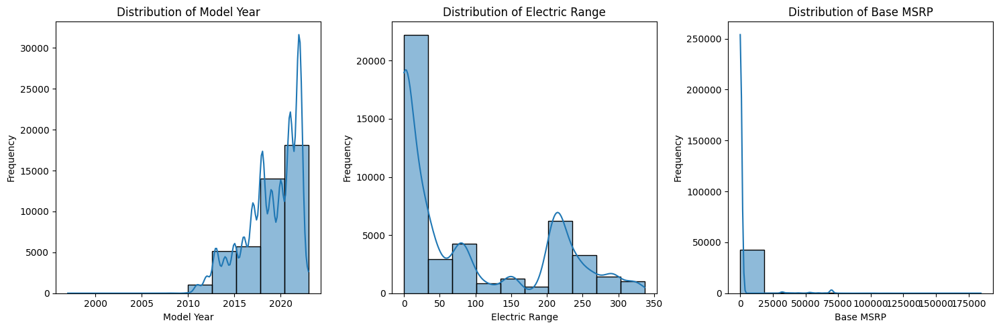

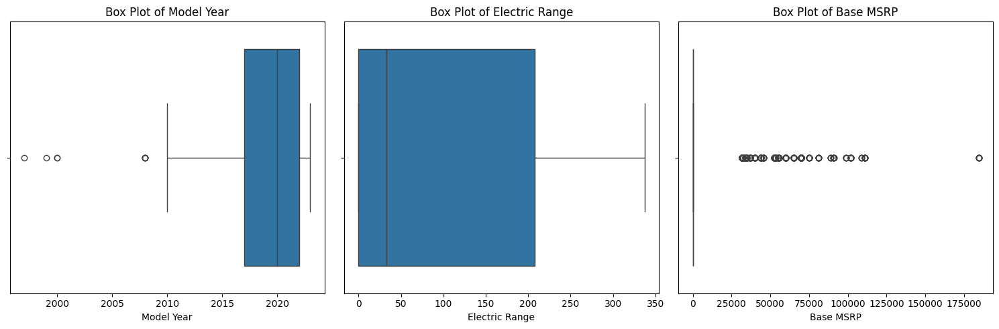

In [11]:
# Display descriptive statistics
print(data[['Model Year', 'Electric Range', 'Base MSRP']].describe())

# Histograms
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(data['Model Year'], bins=10, kde=True)
plt.title('Distribution of Model Year')
plt.xlabel('Model Year')
plt.ylabel('Frequency')

plt.subplot(1, 3, 2)
sns.histplot(data['Electric Range'], bins=10, kde=True)
plt.title('Distribution of Electric Range')
plt.xlabel('Electric Range')
plt.ylabel('Frequency')

plt.subplot(1, 3, 3)
sns.histplot(data['Base MSRP'], bins=10, kde=True)
plt.title('Distribution of Base MSRP')
plt.xlabel('Base MSRP')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Box Plots
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.boxplot(x=data['Model Year'])
plt.title('Box Plot of Model Year')

plt.subplot(1, 3, 2)
sns.boxplot(x=data['Electric Range'])
plt.title('Box Plot of Electric Range')

plt.subplot(1, 3, 3)
sns.boxplot(x=data['Base MSRP'])
plt.title('Box Plot of Base MSRP')

plt.tight_layout()
plt.show()


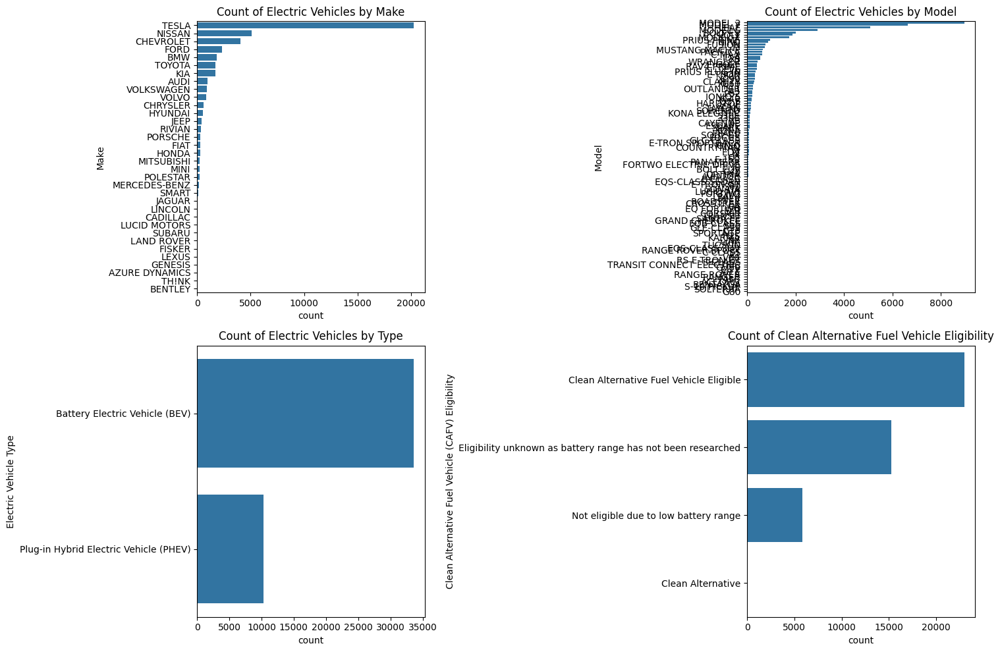

In [12]:
df = pd.DataFrame(data)

# Set the figure size for the plots
plt.figure(figsize=(15, 10))

# Count plot for 'Make'
plt.subplot(2, 2, 1)
sns.countplot(y='Make', data=df, order=df['Make'].value_counts().index)
plt.title('Count of Electric Vehicles by Make')

# Count plot for 'Model'
plt.subplot(2, 2, 2)
sns.countplot(y='Model', data=df, order=df['Model'].value_counts().index)
plt.title('Count of Electric Vehicles by Model')

# Count plot for 'Electric Vehicle Type'
plt.subplot(2, 2, 3)
sns.countplot(y='Electric Vehicle Type', data=df, order=df['Electric Vehicle Type'].value_counts().index)
plt.title('Count of Electric Vehicles by Type')

# Count plot for 'Clean Alternative Fuel Vehicle (CAFV) Eligibility'
plt.subplot(2, 2, 4)
sns.countplot(y='Clean Alternative Fuel Vehicle (CAFV) Eligibility', data=df, order=df['Clean Alternative Fuel Vehicle (CAFV) Eligibility'].value_counts().index)
plt.title('Count of Clean Alternative Fuel Vehicle Eligibility')

# Adjust layout and display plots
plt.tight_layout()
plt.show()


#**BIVARIATE ANALYSIS**

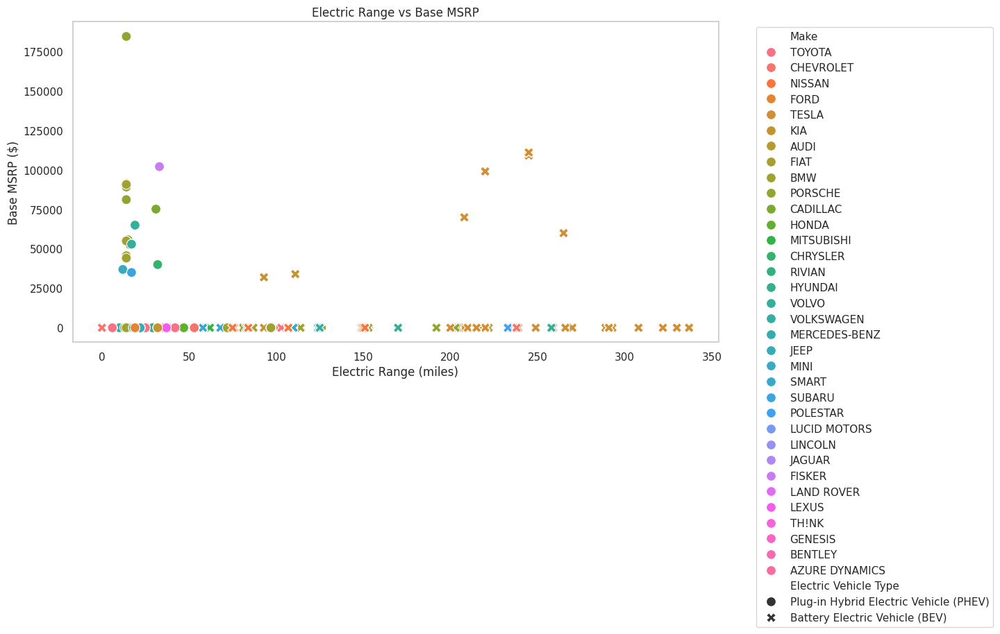

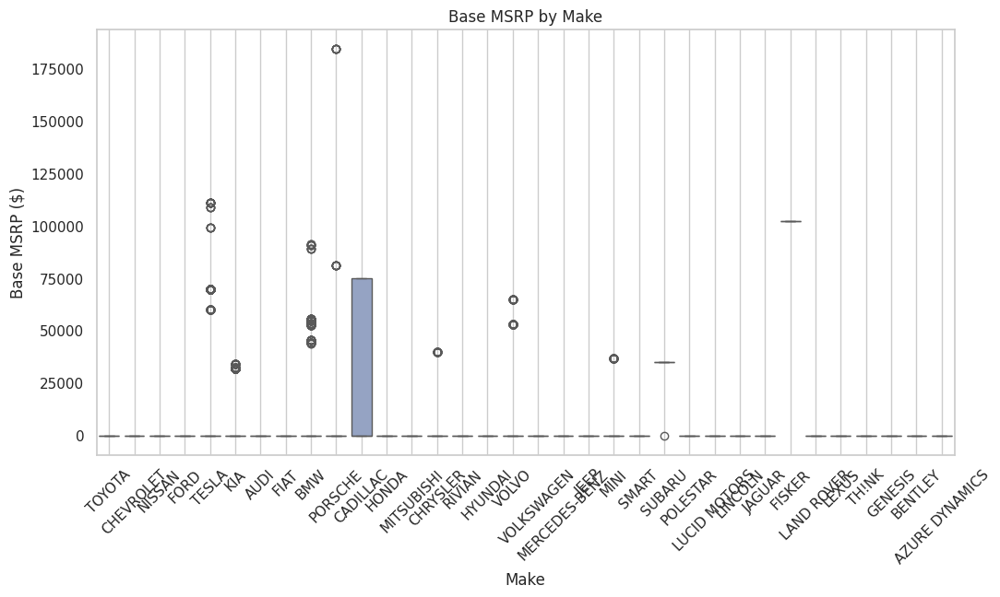

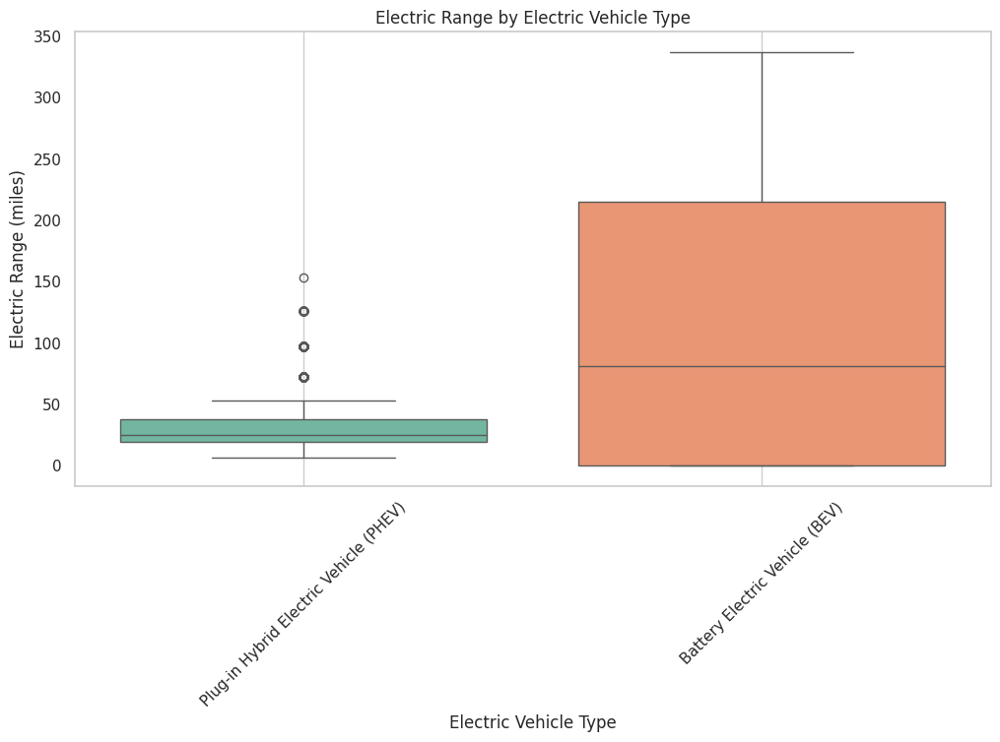

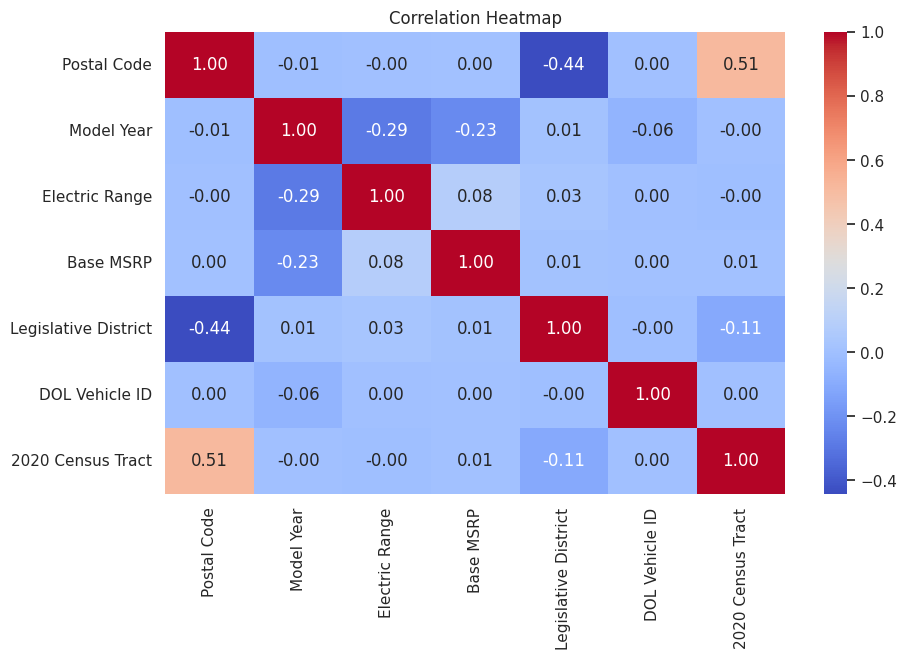

In [13]:
# Set the aesthetics for the plots
sns.set(style="whitegrid")

# 1. Scatter Plot: Electric Range vs Base MSRP
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='Electric Range', y='Base MSRP', hue='Make', style='Electric Vehicle Type', s=100)
plt.title('Electric Range vs Base MSRP')
plt.xlabel('Electric Range (miles)')
plt.ylabel('Base MSRP ($)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.show()

# 2. Box Plot: Base MSRP by Make
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Make', y='Base MSRP', palette='Set2')
plt.title('Base MSRP by Make')
plt.xlabel('Make')
plt.ylabel('Base MSRP ($)')
plt.xticks(rotation=45)
plt.grid()
plt.show()

# 3. Box Plot: Electric Range by Electric Vehicle Type
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Electric Vehicle Type', y='Electric Range', palette='Set2')
plt.title('Electric Range by Electric Vehicle Type')
plt.xlabel('Electric Vehicle Type')
plt.ylabel('Electric Range (miles)')
plt.xticks(rotation=45)
plt.grid()
plt.show()

# 4. Correlation Heatmap
# Select only numeric columns for correlation
numeric_df = df.select_dtypes(include='number')

plt.figure(figsize=(10, 6))
correlation_matrix = numeric_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

#**TASK-2**

**1.SCATTER PLOTING**

In [14]:
#Scatter plot on EV vs MSRP
fig = px.scatter(data,
                 x='Electric Range',              # X-axis: Electric Range
                 y='Base MSRP',                   # Y-axis: Base MSRP
                 color='Make',                    # Color points by Make
                 hover_name='Model',              # Hover information to display
                 title='Scatter Plot: Electric Range vs Base MSRP',  # Title of the plot
                 labels={'Electric Range': 'Electric Range (miles)',   # X-axis label
                         'Base MSRP': 'Base MSRP ($)'})  # Y-axis label

# Show the plot
fig.show()

**2.BOX PLOTTING**

In [15]:
#Box plotting on univariate and bivariate
fig_univariate = px.box(data,
                        y='Base MSRP',                   # Numeric column for the box plot
                        title='Univariate Box Plot: Base MSRP',  # Title of the plot
                        labels={'Base MSRP': 'Base MSRP ($)'}  # Y-axis label
                       )

# Show the univariate box plot
fig_univariate.show()

fig_bivariate = px.box(df,
                       x='Electric Vehicle Type',       # Categorical column
                       y='Electric Range',              # Numeric column
                       title='Bivariate Box Plot: Electric Range by Vehicle Type',  # Title of the plot
                       labels={'Electric Vehicle Type': 'Electric Vehicle Type',
                               'Electric Range': 'Electric Range (miles)'}  # Axis labels
                      )

# Show the bivariate box plot
fig_bivariate.show()

#**3.PIE CHART**

In [16]:

# Pie chart using plotly.express
fig = px.pie(data,  # Your dataframe
    names='Electric Vehicle Type',  # Categorical variable (e.g., 'Electric Vehicle Type')
    values='Base MSRP',  # Numerical variable (e.g., 'Base MSRP')
    title='Proportion of Electric Vehicle Types by Base MSRP',
    labels={'Electric Vehicle Type': 'Vehicle Type'}
)

# Show the pie chart
fig.show()












#**CHOROPLETH PLOT USING PLOTLY.EXPRESS**

In [18]:
#  Load your dataset
#df = pd.read_csv('/content/Dataset.csv')  # Update this line with your dataset path

# Prepare the Data
# Count the number of EVs by State
ev_count = df['State'].value_counts().reset_index()
ev_count.columns = ['State', 'Number of EVs']

# Step 5: Create the Choropleth Plot
fig = px.choropleth(ev_count,
                    locations='State',              # Column containing location names
                    locationmode='USA-states',     # Use USA states
                    color='Number of EVs',          # Column containing values for color coding
                    scope='usa',                    # Limit map to USA
                    title='Number of Electric Vehicles by State',
                    color_continuous_scale=px.colors.sequential.Plasma)  # Choose a color scale

# Show the plot
fig.show()


#**ANIMATED CHOROPLETH PLOT USING PLOTLY.EXPRESS**

In [19]:
import plotly.express as px

# Assuming 'df' is  DataFrame with EV data

fig = px.choropleth(
    df,  #  DataFrame
    locations="State",  # Column with state/region names
    color="Base MSRP",  # Column for color intensity (e.g., Base MSRP)
    hover_name="State",  # Column for hover text
    animation_frame="Model Year",  # Column for animation (e.g., year)
    locationmode="USA-states",  # Set location mode for US states
    scope="usa",  # Focus on USA map
    title="Electrical Vechile Base MSRP Animation by State",
    color_continuous_scale="Turbo",  # Choose a vibrant color scale
)

fig.update_layout(
    title_font_size=24,          # Adjust title font size
    geo_bgcolor='lightgrey',     # Set background color of the map
    font=dict(size=16, color='darkblue'),  # Set font properties for the entire plot
)

# Show the animated choropleth plot
fig.show()


#**TASK-3**

#**RACING BAR PLOT**

In [20]:
# step 1:Install the bar-chart-race module using pip.
!pip install bar-chart-race


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 kB 3.4 MB/s eta 0:00:00


In [21]:
# Step 2: Import the required library
import bar_chart_race as bcr


In [24]:
# Load the dataset
# Assuming the dataset is saved as 'Dataset.csv'
df = pd.read_csv('/content/Dataset.csv')

# Prepare the data for bar chart racing
# Group the data by 'Model Year' and 'Make', then count the occurrences of each make for each year
final = df.groupby(['Model Year', 'Make']).size().unstack(fill_value=0)

# Call the bar_chart_race function to create the racing bar plot
bcr.bar_chart_race(
    # The DataFrame where each row represents a period of time (in this case, year-wise EV make counts)
    df=final,

    # Name of the output video file
    filename="final.mp4",

    # Orientation of the bars ('h' for horizontal)
    orientation="h",

    # Sort bars in descending order for each period
    sort="desc",

    # Number of bars to display in each frame
    n_bars=10,

    # Smoothness of the animation (higher values make the animation smoother)
    steps_per_period=45,

    # Duration of each period in milliseconds (3000ms = 3 seconds per frame)
    period_length=3000,

    # Title of the chart and its styling
    title='Year-wise EV Makes and their Counts',
)

# The animated bar chart will be saved as 'final.mp4'


In [28]:
# Import necessary libraries
from IPython.display import Video

# Assuming 'final' is your prepared DataFrame with EV counts by make and year
# Create the Racing Bar Plot animation
bcr.bar_chart_race(
    df=final,  # 'final' should be your prepared DataFrame with EV counts by make and year
    filename="final.mp4",  # Name of the output video file
    figsize=(10,5 ),  # Figure size
    dpi=120,           # Dots per inch for better quality
    orientation="h",   # Horizontal bar chart
    sort="desc",       # Sort bars descending in each frame
    n_bars=10,         # Number of bars to display per frame
    steps_per_period=45,  # Number of animation steps per year
    period_length=2500,   # Period length in milliseconds ( 2.5 seconds for each year)
    bar_kwargs={'alpha': 0.99, 'lw': 0},  # Bar opacity and line width
    title='Year-wise EV Make Counts',  # Main title
    title_size=20,                     # Title font size
    period_label={'x': 0.95, 'y': 0.15,  # Position of the period label (year)
                  'ha': 'right', 'va': 'center'},  # Alignment of period label
    # Removed unsupported parameters like bar_texttemplate
)

# Display the video
Video("final.mp4", embed=True)


#**CONCLUSION**

#**Task 1: Exploratory Data Analysis (EDA)**

Objective:
The goal of this EDA is to explore trends in EV adoption, pricing, range, and regional distribution. Through univariate and bivariate analysis, we aim to identify key insights on market growth, manufacturer dominance, and the influence of price and location on EV ownership.

Univariate Analysis:
EV Growth: EV registrations surged after 2015, with Tesla leading the market.
Make Distribution: Tesla dominates, followed by Nissan and Chevrolet.
Price Distribution: Most EVs fall in the mid-to-high price range, with premium models offering better performance.

Bivariate Analysis:
Price vs Range: Higher-priced EVs generally have longer ranges.
State vs Registrations: California, Washington, and New York lead in EV registrations due to supportive policies.

#**Task 2: Choropleth Map of EV Count by Location**

Objective:
The objective is to analyze the geographic distribution of EV adoption through a choropleth map, highlighting the influence of regional policies, infrastructure, and incentives on electric vehicle penetration across different states.

The choropleth map visually emphasizes the geographic concentration of EVs. States like California, Washington, and New York are hotspots for EV adoption due to progressive environmental policies and urban infrastructure.
This regional variation points to policy-driven adoption patterns, where states with more incentives and awareness programs see higher EV penetration.

#**Task 3: Racing Bar Plot of EV Make and Count per Year**

Objective:
The objective is to visualize the competitive landscape of EV manufacturers over time using a racing bar plot, focusing on Tesla's market dominance and the relative performance of other brands like Nissan and Chevrolet. This analysis aims to highlight the growth trends and competitive shifts in the EV market.

The racing bar plot highlights Tesla's meteoric rise over the last decade, capturing a majority of the EV market share, particularly after 2015. Other manufacturers such as Nissan and Chevrolet maintained their presence but did not experience similar growth.
This dynamic visualization underscores Tesla’s market leadership, with other brands unable to match its speed of innovation, range offerings, and consumer appeal.